# Problem Description
### Here are the rules:
 1. The challenge should be completed in **Python**. You’re free to use any model types you want.
 2. Please refrain from using AutoML or any similar automated data science packages. We want to see what you can do as a data scientist, rather than a ML model builder.
 3. Track any iterations you make when tuning the model. We’re interested in the process you take to get to a model too, not just the outcome. You can just leave commented-out lines with prior iterations within your code.
 4. Don’t forget to document your steps in a way to show us what and why you chose the steps you take.
 5. You will have **one week** from receiving this assignment to complete it. Please send your work to vanessa@uken.com as a zip file with the following naming convention firstname_lastname_ds_assignment.zip .
 6. Please do not create a public fork of this repo.
 
### Part 1
For this assignment you will be required to create a classification model. It will be a variation of a spender prediction problem. The goal is to predict whether or not a user is going to spend between days 2-6 of their lifetime.

For example if a user installed on the Monday (Day 0), the goal would be to predict if they would spend from Wednesday to Sunday (Days 2-6). In other words Monday and Tuesday (Days 0-1), would be used as our training data.

| Day Number | 0 | 1 | 2 | 3 | 4 | 5 | 6 |
| --- | --- | --- | --- | --- | --- | --- | --- |
| Day | M | T | W | T | F | S | S |

### Part 2
Once a model is created we also want to hear about how you would implement this into a business solution relevant to the company. Please include this at the end of the notebook once you have a model you are satisfied with.

# Data Dictionary
This data set contains match and revenue data from one of our solitaire titles. 

## User Data 
- id: id of the user
- install_date: date the user installed
- platform: which platform the user installed on 
- install_source: which install source the user came from 
- country: which country the user is from 

## Match Data
***All match data is from days 0-1 of the users' lifetime***
- matches_played: number of matches played
- matches_won: number of matches won 
- errors: number of errors made while playing
- unfixed_errors: number of errors left unfixed, would have to use undo powerup to fix error
- coins_spent: total coins spent, coins will be used to purchase powerups
- wild_powerup_used: wilds used while playing, wilds can be used to match any card in the game
- undo_powerup_used: undos used while playing, undo allows the user to undo the previous action
- extra_cards_powerup_used: extra cards used while playing, if the user runs out of cards in the draw pile they can use this to get extra cards

## Revenue Data
- pre_d1_revenue: revenue on days 0-1 of the users' lifetime
- post_d1_revenue: revenue from days 2-6 of the users' lifetime 
- response: whether or not they spent from day 2-6

# Solution

## Read Data

In [44]:
# import train dataset
import pandas as pd
df=pd.read_csv('uken_train_data.csv')

In [45]:
df.head()

,id,install_date,platform,install_source,country,matches_played,matches_won,errors,unfixed_errors,coins_spent,wild_powerup_used,undo_powerup_used,extra_cards_powerup_used,pre_d1_revenue,post_d1_revenue,response
0,0,2021-01-01,ios,organic,FR,40,26.0,36.0,30.0,2590.0,3.0,5.0,1.0,0.0,0.0,0
1,1,2021-01-01,android,community,FR,68,44.0,55.0,47.0,6168.0,6.0,3.0,9.0,0.0,0.0,0
2,2,2021-01-01,android,mistplay,AU,4,3.0,15.0,9.0,2704.0,0.0,2.0,1.0,0.0,0.0,0
3,3,2021-01-01,ios,facebook,US,28,23.0,14.0,0.0,2878.0,4.0,15.0,2.0,0.0,0.0,0
4,4,2021-01-01,android,organic,WS,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0


## Data Description

In [46]:
# Check missing
df_missing=df.isnull()
for column in df_missing.columns.values.tolist():
    print(column)
    print (df_missing[column].value_counts())
    print("")

id
False    51188
Name: id, dtype: int64

install_date
False    51188
Name: install_date, dtype: int64

platform
False    51188
Name: platform, dtype: int64

install_source
False    51188
Name: install_source, dtype: int64

country
False    51183
True         5
Name: country, dtype: int64

matches_played
False    51188
Name: matches_played, dtype: int64

matches_won
False    51188
Name: matches_won, dtype: int64

errors
False    51188
Name: errors, dtype: int64

unfixed_errors
False    51188
Name: unfixed_errors, dtype: int64

coins_spent
False    51188
Name: coins_spent, dtype: int64

wild_powerup_used
False    51188
Name: wild_powerup_used, dtype: int64

undo_powerup_used
False    51188
Name: undo_powerup_used, dtype: int64

extra_cards_powerup_used
False    51188
Name: extra_cards_powerup_used, dtype: int64

pre_d1_revenue
False    51188
Name: pre_d1_revenue, dtype: int64

post_d1_revenue
False    51188
Name: post_d1_revenue, dtype: int64

response
False    51188
Name: response, dty

In [47]:
# Data Description
df.describe()

,id,matches_played,matches_won,errors,unfixed_errors,coins_spent,wild_powerup_used,undo_powerup_used,extra_cards_powerup_used,pre_d1_revenue,post_d1_revenue,response
count,51188.000000,51188.00000,51188.000000,51188.000000,51188.000000,5.118800e+04,51188.000000,51188.000000,51188.000000,51188.000000,51188.000000,51188.000000
mean,25593.500000,25.77819,19.467844,13.871650,7.112917,2.369985e+03,2.948836,5.555697,2.320524,0.682291,0.329726,0.032019
std,14776.847127,34.22489,22.905226,23.294392,15.942237,6.428629e+03,4.055886,8.730643,3.709113,8.107913,3.598139,0.176053
min,0.000000,1.00000,0.000000,0.000000,0.000000,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,12796.750000,3.00000,3.000000,0.000000,0.000000,6.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,25593.500000,11.00000,10.000000,4.000000,1.000000,1.436000e+03,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,38390.250000,35.00000,29.000000,17.000000,7.000000,3.192000e+03,5.000000,7.000000,3.000000,0.000000,0.000000,0.000000
max,51187.000000,357.00000,357.000000,341.000000,303.000000,1.069543e+06,247.000000,155.000000,180.000000,729.900000,272.850000,1.000000


## Data Exploration

### Label Distribution

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='response', ylabel='count'>

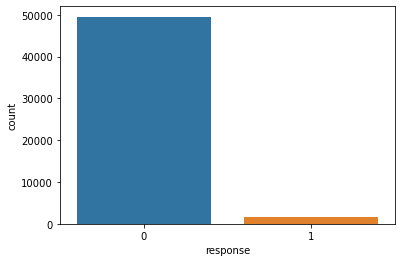

In [48]:
import seaborn as sns
sns.countplot(df['response'])

### Univariate Analysis

#### Categorical Variables

In [49]:
cat_list=['platform', 'install_source']

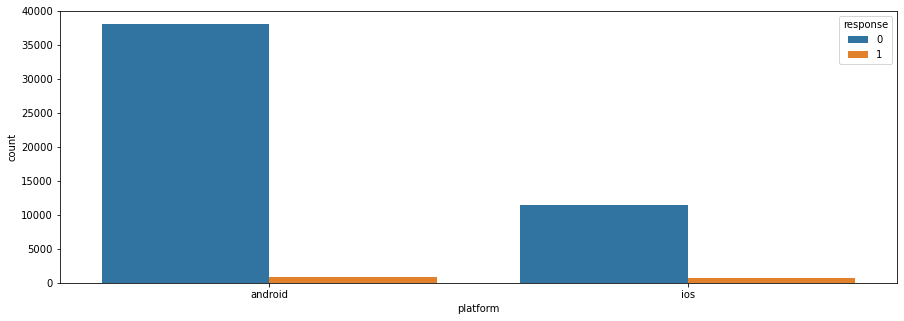

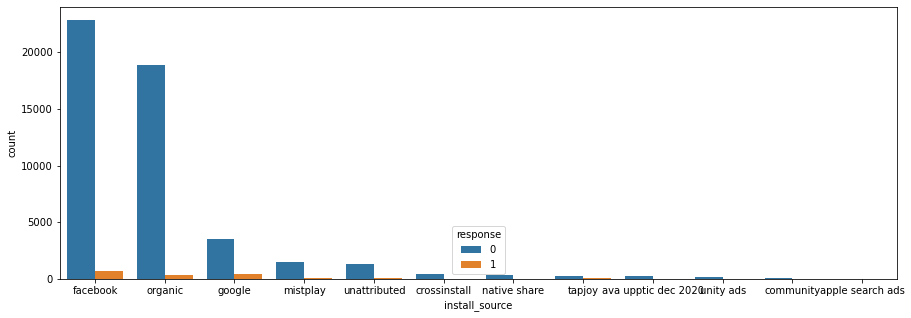

In [50]:
# Count plot
import matplotlib.pyplot as plt
for c in cat_list:
    fig, ax = plt.subplots(figsize=(15, 5))
    sns.countplot (x=c, ax=ax, hue='response', data=df, order = df[c].value_counts().index)
    plt.show()

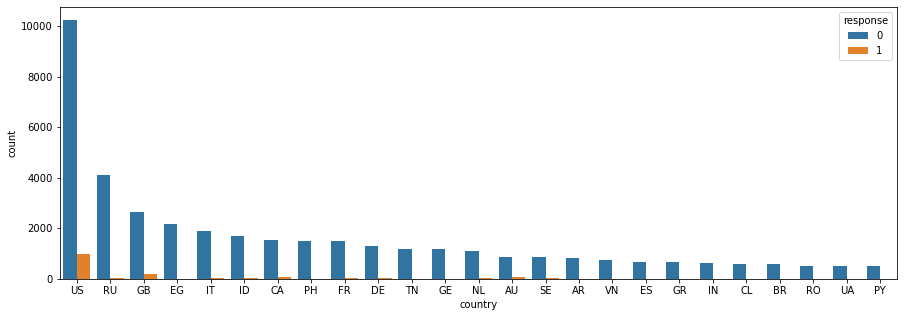

In [51]:
# For the country plot, let's just take countries with observation>=500
df_filter=df[df.groupby('country')['country'].transform('size') >= 500]
fig, ax = plt.subplots(figsize=(15, 5))
sns.countplot (x='country', ax=ax, hue='response', data=df_filter, order = df_filter['country'].value_counts().index)
plt.show()

#### Continous Variables

In [52]:
# Matches variables
match_list=['matches_played', 'matches_won', 'errors', 'unfixed_errors', 'coins_spent', 'wild_powerup_used', 'undo_powerup_used', 'extra_cards_powerup_used']

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


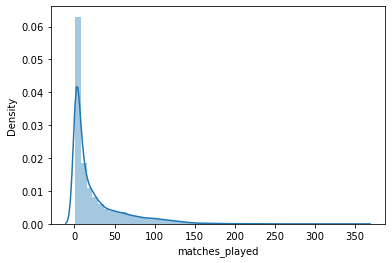

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


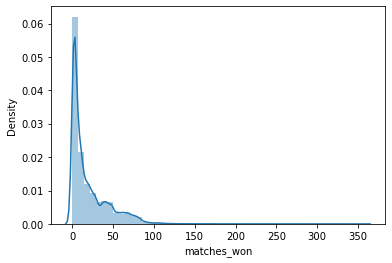

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


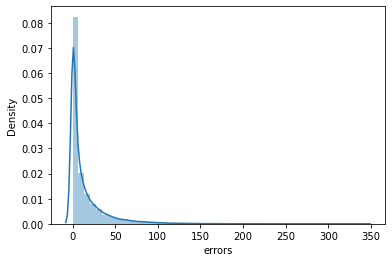

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


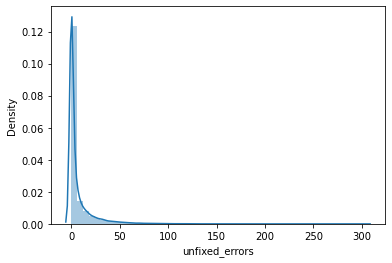

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


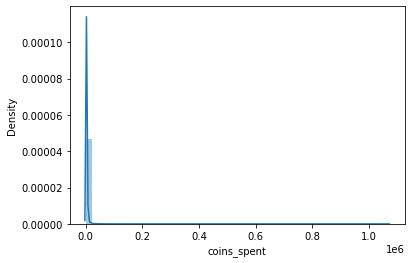

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


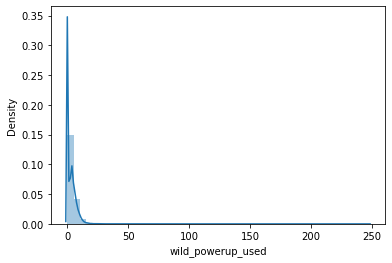

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


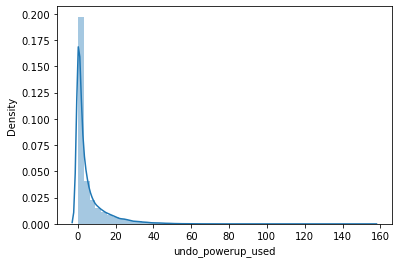

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


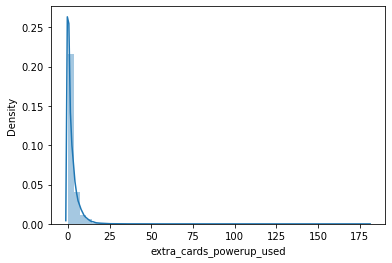

In [53]:
for m in match_list:
#     sns.boxplot(df[m])
#     plt.show()
    sns.distplot(df[m])
    plt.show()
#     fig = plt.figure()
#     res = stats.probplot(df[m], plot=plt)
#     plt.show()

In [54]:
# Revenue variables
revenue_list=['pre_d1_revenue', 'post_d1_revenue']

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


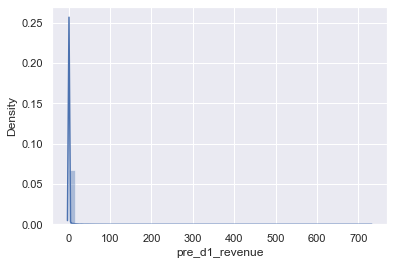

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


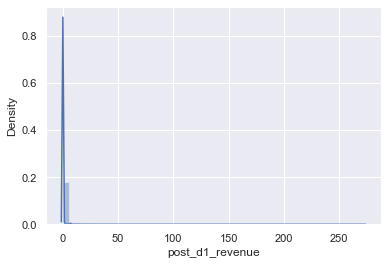

In [113]:
for m in revenue_list:
    sns.distplot(df[m])
    plt.show()
#     fig = plt.figure()
#     res = stats.probplot(df[m], plot=plt)
#     plt.show()

### Correlation Analysis

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\matrix.py:1216: UserWarning: ``square=True`` ignored in clustermap
  warnings.warn(msg)


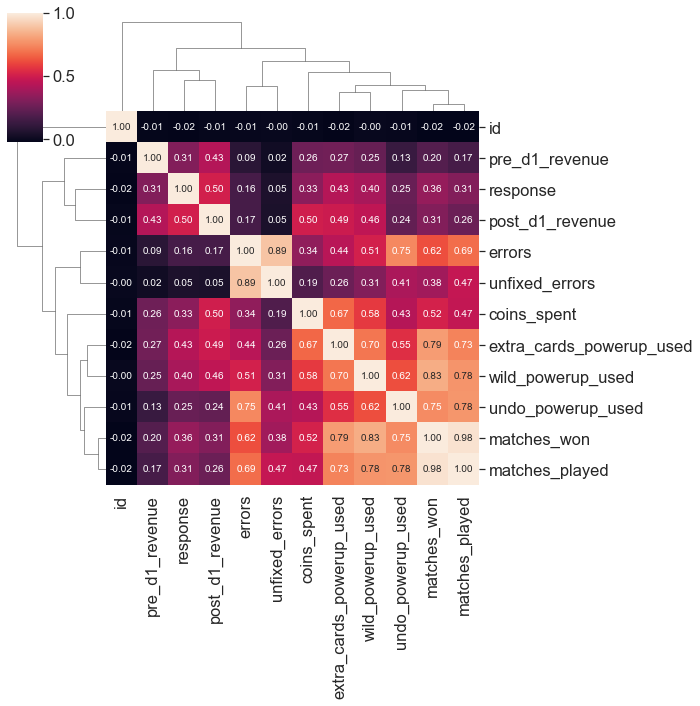

In [55]:
import numpy as np
import matplotlib.pyplot as plt
k = len(df.columns)
corrmat = df.corr()
cols = corrmat.nlargest(k, 'response')['response'].index
cm = np.corrcoef(df[cols].values.T)
sns.set(font_scale=1.5)
hm = sns.clustermap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.setp(hm.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
plt.show()

### Multicollinearity

In [56]:
# From the above correlation chart, we could find some features have multicollinearity, let's check VIF
# calculate VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)
X=df[match_list+['pre_d1_revenue']]
calc_vif(X)

,variables,VIF
0,matches_played,45.966715
1,matches_won,61.725627
2,errors,46.887089
3,unfixed_errors,22.616778
4,coins_spent,2.367641
5,wild_powerup_used,6.212892
6,undo_powerup_used,13.744717
7,extra_cards_powerup_used,5.498200
8,pre_d1_revenue,1.119814


In [57]:
# matches variables are highly correlated because everything is releated with # of matches play, so let's divide the matches and use the rate
# Also, let's extract fix+unfix errors from the total error columns
df['won_rate']=df['matches_won']/df['matches_played']
df['fix_error_rate']=(df['errors']-df['unfixed_errors'])/df['matches_played']
df['unfixed_error_rate']=df['unfixed_errors']/df['matches_played']
X_new=df[['matches_played', 'won_rate', 'fix_error_rate', 'unfixed_error_rate', 'coins_spent', 'wild_powerup_used', 'undo_powerup_used', 'extra_cards_powerup_used', 'pre_d1_revenue']]
calc_vif(X_new)

,variables,VIF
0,matches_played,8.014728
1,won_rate,1.837556
2,fix_error_rate,2.091356
3,unfixed_error_rate,1.263492
4,coins_spent,2.338934
5,wild_powerup_used,4.691270
6,undo_powerup_used,4.488361
7,extra_cards_powerup_used,4.574032
8,pre_d1_revenue,1.116868


### Bivariate analysis

In [58]:
# New df columns
col_need=['install_date', 'platform', 'install_source', 'country', 'matches_played', 'won_rate', 'fix_error_rate', 'unfixed_error_rate', 'coins_spent', 'wild_powerup_used', 'undo_powerup_used', 'extra_cards_powerup_used', 'pre_d1_revenue', 'post_d1_revenue', 'response']
df2=df[col_need]
df2.loc['install_date']=pd.to_datetime(df2['install_date'])
df2.head()

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\pandas\core\indexing.py:692: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)


,install_date,platform,install_source,country,matches_played,won_rate,fix_error_rate,unfixed_error_rate,coins_spent,wild_powerup_used,undo_powerup_used,extra_cards_powerup_used,pre_d1_revenue,post_d1_revenue,response
0,2021-01-01,ios,organic,FR,40,0.650000,0.150000,0.750000,2590.0,3.0,5.0,1.0,0.0,0.0,0
1,2021-01-01,android,community,FR,68,0.647059,0.117647,0.691176,6168.0,6.0,3.0,9.0,0.0,0.0,0
2,2021-01-01,android,mistplay,AU,4,0.750000,1.500000,2.250000,2704.0,0.0,2.0,1.0,0.0,0.0,0
3,2021-01-01,ios,facebook,US,28,0.821429,0.500000,0.000000,2878.0,4.0,15.0,2.0,0.0,0.0,0
4,2021-01-01,android,organic,WS,1,1.000000,0.000000,0.000000,1.0,0.0,0.0,0.0,0.0,0.0,0


C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


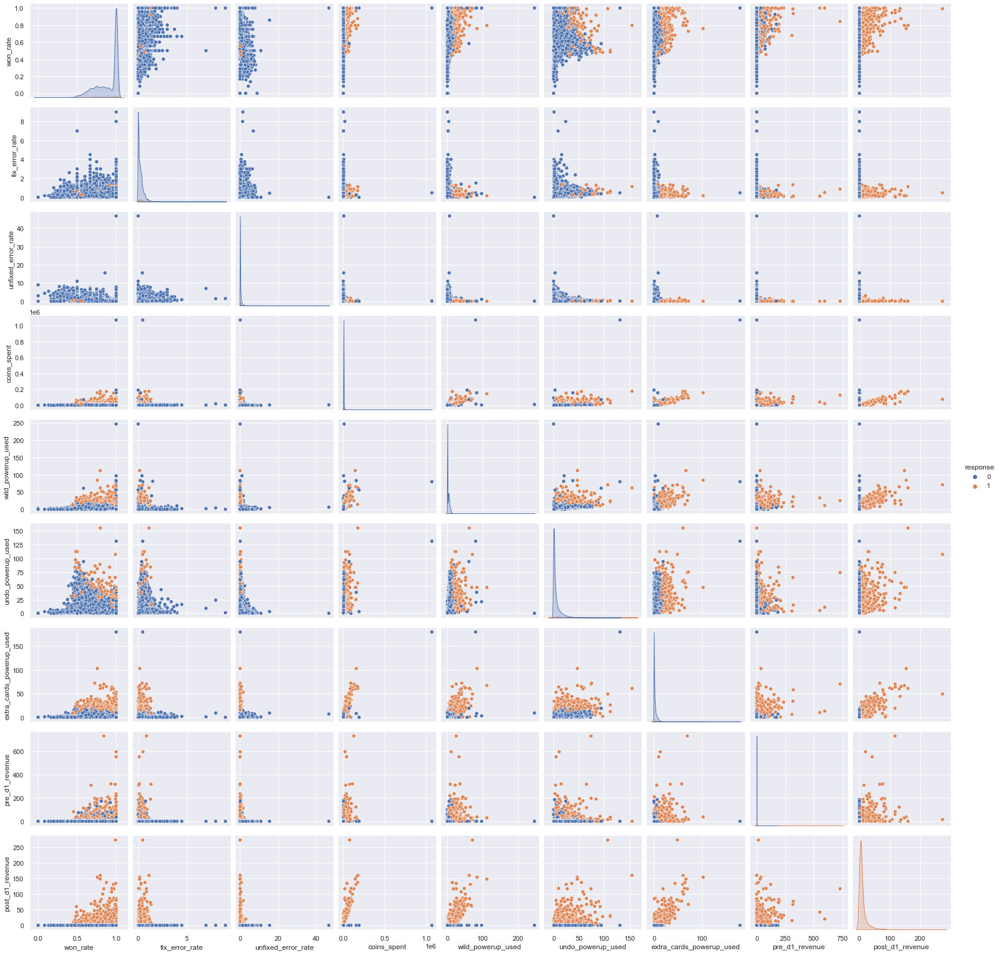

In [59]:
sns.set()
sns.pairplot(df2, height = 2.5, hue="response")
plt.show()

### PCA Dimension Reduction & Visualisation

In [60]:
# Let's reduce the dimension for continous features and visulise them to see how good the feature for classification
# Normalize the X data because the scales of independent variables are very different. And PCA would be affected by scale
from sklearn import preprocessing
standard_scaler=preprocessing.StandardScaler()
X_scaled = standard_scaler.fit_transform(X_new)
X_rescale=pd.DataFrame(X_scaled)
# Create the new data frame by transforming data using PCA
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
components=pca.fit_transform(X_rescale)
componentsDf=pd.DataFrame(data=components, columns=['component'+str(i) for i in range(1,4)])

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


In [61]:
# Have a look of PCA variables
componentsDf.head()

,component1,component2,component3
0,0.517212,1.123458,-0.351077
1,2.196468,0.291622,-0.424889
2,0.138995,4.608130,2.601031
3,0.761165,0.401032,-0.130920
4,-1.684428,-0.674025,-0.075192


In [62]:
# Check explained variance ratio
# The 3 components explained around 72% of the variance
print(pca.explained_variance_ratio_)

[0.44206968 0.16624587 0.1095966 ]


In [63]:
# Let's visualise it
import plotly.express as px
fig=px.scatter_3d(x=componentsDf['component1'], y=componentsDf['component2'], z=componentsDf['component3'], color=df['response'])
fig.show()

In [65]:
# Find 6 outliers, let's check them
outlier1=componentsDf.index[componentsDf['component1']>96]
outlier2=componentsDf.index[componentsDf['component2']>47]
outlier3=componentsDf.index[(componentsDf['component1']>15.293) & (componentsDf['component1']<15.294)]
outlier4=componentsDf.index[(componentsDf['component1']>20.28) & (componentsDf['component1']<20.29)]
outlier5=componentsDf.index[(componentsDf['component1']>19.58) & (componentsDf['component1']<19.59)]
outlier6=componentsDf.index[(componentsDf['component1']>27.04) & (componentsDf['component1']<27.05)]

In [66]:
# Check the first one
df.iloc[outlier1[0]]

id                               45731
install_date                2021-01-13
platform                       android
install_source                 organic
country                             RU
matches_played                     357
matches_won                      357.0
errors                           218.0
unfixed_errors                    50.0
coins_spent                  1069543.0
wild_powerup_used                 80.0
undo_powerup_used                131.0
extra_cards_powerup_used         180.0
pre_d1_revenue                     0.0
post_d1_revenue                    0.0
response                             0
won_rate                           1.0
fix_error_rate                0.470588
unfixed_error_rate            0.140056
Name: 45731, dtype: object

In [67]:
outlier1[0]

45731

In [68]:
# These 2 outliers could affect the model, let's drop them
df= df.drop(df[df.id==outlier1[0]].index)
df= df.drop(df[df.id==outlier2[0]].index)
df= df.drop(df[df.id==outlier3[0]].index)
df= df.drop(df[df.id==outlier4[0]].index)
df= df.drop(df[df.id==outlier5[0]].index)
df= df.drop(df[df.id==outlier6[0]].index)
df= df.drop(df[df.install_source=='apple search ads'].index)
df=df.reset_index()

## Data Exploration Conclusion
- Data does not include any missings
- Both features and labels are highly schewed distributed
- Label variable (response) is unbalanced
- Matches features are highly correlated, use the rate instead
- Have 6 outliers, drop them
- Generally, features in the dataset has good explainability for the label
- Country has many categories, most of them have very few customers, let's just take top 15

## Model

### Feature Engineering

In [69]:
# Extract date info from install date
df['month']=pd.DatetimeIndex(df['install_date']).month.astype('object')
col_x=['month', 'platform', 'install_source', 'country', 'matches_played', 'won_rate', 'fix_error_rate', 'unfixed_error_rate', 'coins_spent', 'wild_powerup_used', 'undo_powerup_used', 'extra_cards_powerup_used', 'pre_d1_revenue']
# Build features and label
X=df[col_x]
y_temp=df[['response', 'post_d1_revenue']]
# Only use top 15 countries
top15_country=list(df_filter['country'].value_counts().index[:15])
def label_country (row):
    if row['country'] in top15_country:
        return row['country']
    return 'OTHER'
X['country']=X.apply(lambda row: label_country(row), axis=1)

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\ipykernel_launcher.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [70]:
# One hot encoding for categorical vriables
obj_X = X.select_dtypes(include=['object']).copy()
obj_X=pd.get_dummies(obj_X, drop_first=True)

In [71]:
# Standardize numeric variables
num_X = X.select_dtypes(include=['int64', 'float64']).copy()
standard_scaler=preprocessing.StandardScaler()
X_scaled = standard_scaler.fit_transform(num_X)
X_scaled_df=pd.DataFrame(X_scaled)
X_scaled_df=X_scaled_df.rename(columns={0:'matches_played', 1:'won_rate', 2:'fix_error_rate', 3:'unfixed_error_rate', 4:'coins_spent', 5:'wild_powerup_used', 6:'undo_powerup_used', 7:'extra_cards_powerup_used', 8:'pre_d1_revenue'})
X_scaled_df=X_scaled_df.reset_index()

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



In [72]:
# Merge categorical and numerical variables
X_df=obj_X.join(X_scaled_df, how='outer')
X_df=X_df.drop('index', axis=1)

### Train Test Split

In [73]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train_temp, y_test_temp = train_test_split(X_df, y_temp, train_size=0.8)

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\model_selection\_split.py:2178: FutureWarning:

From version 0.21, test_size will always complement train_size unless both are specified.



In [74]:
y_train=y_train_temp['response']
y_test=y_test_temp['response']

### Build RandomForest as Benchmark Model

In [75]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
clf = RandomForestClassifier(max_depth=10, n_estimators=32)
clf.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=10, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=32, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [76]:
# Make predictions for the test set
y_pred_test = clf.predict(x_test)

In [77]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
# View accuracy score
accuracy_score(y_test, y_pred_test)

0.9857380091823776

In [78]:
# View confusion matrix for test data and predictions
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_test).ravel()
print('confusion matrix')
print(np.array([[tp,fp],[fn,tn]]))
print('sensitivity is %f',1.*tp/(tp+fn))
print('specificity is %f',1.*tn/(tn+fp))
print('accuracy is %f',1.*(tp+tn)/(tp+tn+fp+fn))
print('balanced accuracy is %',1./2*(1.*tp/(tp+fn)+1.*tn/(tn+fp)))

confusion matrix
[[ 187   16]
 [ 130 9904]]
sensitivity is %f 0.5899053627760252
specificity is %f 0.9983870967741936
accuracy is %f 0.9857380091823776
balanced accuracy is % 0.7941462297751094


- After I did a few manual hyperparameter tunings, the benchmark random forest model has a F1 score of 0.73.
- The most possible reason for this is the label is very unbalanced, random forest itself is not suited for skewed calss distribution
- Therefore, let's try to use a random forest with class weighting

### Random Forest with Class Weighting

In [79]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
# define model
clf_w = RandomForestClassifier(max_depth=13, n_estimators=35, class_weight='balanced_subsample', random_state=0)
clf_w.fit(x_train, y_train)
y_pred_test = clf_w.predict(x_test)

In [80]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_test).ravel()
print('confusion matrix')
print(np.array([[tp,fp],[fn,tn]]))
print('sensitivity is %f',1.*tp/(tp+fn))
print('specificity is %f',1.*tn/(tn+fp))
print('accuracy is %f',1.*(tp+tn)/(tp+tn+fp+fn))
print('balanced accuracy is %',1./2*(1.*tp/(tp+fn)+1.*tn/(tn+fp)))

confusion matrix
[[ 218   92]
 [  99 9828]]
sensitivity is %f 0.6876971608832808
specificity is %f 0.9907258064516129
accuracy is %f 0.9813421900947543
balanced accuracy is % 0.8392114836674469


<AxesSubplot:>

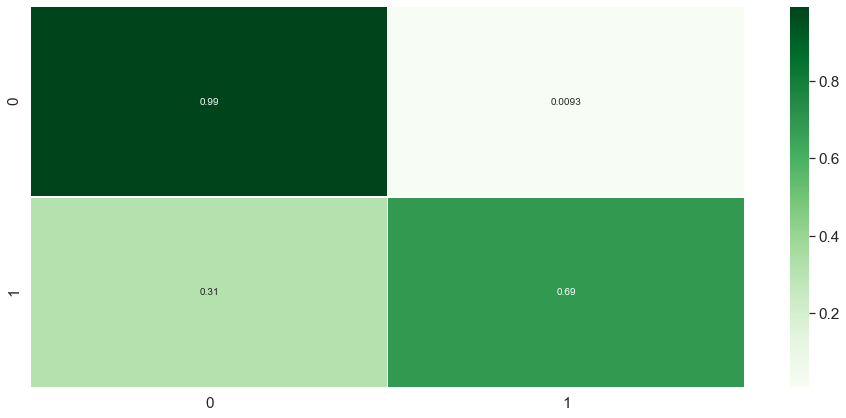

In [81]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test, y_pred_test)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

- After bring in weight factor, the result was better

#### Hyperparameter Tuning

In [315]:
# Have a look of all parameters of random forest classfier
from pprint import pprint
# Look at parameters used by our current forest
print('Parameters currently in use:\n')
pprint(clf_w.get_params())

Parameters currently in use:

{'bootstrap': True,
 'class_weight': 'balanced_subsample',
 'criterion': 'gini',
 'max_depth': 13,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 35,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 0,
 'verbose': 0,
 'warm_start': False}


In [316]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 100, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Weighted random forest
class_weight=['balanced', 'balanced_subsample']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'class_weight': class_weight,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}
pprint(random_grid)

{'bootstrap': [True, False],
 'class_weight': ['balanced', 'balanced_subsample'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'max_features': ['auto', 'sqrt'],
 'min_samples_leaf': [1, 2, 4],
 'min_samples_split': [2, 5, 10],
 'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]}


In [317]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestClassifier()
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = 1)
# Fit the random search model
rf_random.fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False, total=   1.4s
[CV] n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s remaining:    0.0s


[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False, total=   2.6s
[CV] n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=False, total=   1.3s
[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=20, class_weight=balanced, bootstrap=False 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=20, class_weight=balanced, bootstrap=False, total=   0.1s
[CV] n_estimators=10, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=20, class_weight=balanced, bootstrap=False 
[CV]  n_estimators=10, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=20, class_wei

[CV]  n_estimators=100, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=True, total=   2.1s
[CV] n_estimators=80, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False, total=   1.8s
[CV] n_estimators=80, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False, total=   1.7s
[CV] n_estimators=80, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=10, min_samples_leaf=2,

[CV]  n_estimators=70, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=10, class_weight=balanced_subsample, bootstrap=False, total=   1.4s
[CV] n_estimators=70, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=10, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=70, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=10, class_weight=balanced_subsample, bootstrap=False, total=   1.9s
[CV] n_estimators=70, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=10, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=70, min_samples_split=5, min_samples_leaf=2, max_features=auto, max_depth=10, class_weight=balanced_subsample, bootstrap=False, total=   1.6s
[CV] n_estimators=60, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=60, class_weight=balanced, bootstrap=True 
[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_d

[CV]  n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=True, total=   1.5s
[CV] n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=sqrt, max_depth=20, class_weight=balanced_subsample, bootstrap=True, total=   1.4s
[CV] n_estimators=40, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, class_weight=balanced, bootstrap=True 
[CV]  n_estimators=40, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, class_weight=balanced, bootstrap=True, total=   0.6s
[CV] n_estimators=40, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, class_weight=balanced, bootstrap=True 
[CV]  n_estimators=40, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, class_weight=ba

[CV]  n_estimators=100, min_samples_split=2, min_samples_leaf=2, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False, total=   2.3s
[CV] n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, class_weight=balanced_subsample, bootstrap=True, total=   1.7s
[CV] n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, class_weight=balanced_subsample, bootstrap=True, total=   1.5s
[CV] n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=70, min_samples_split=10, min_samples_leaf=4, max_feature

[CV]  n_estimators=10, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=110, class_weight=balanced, bootstrap=True, total=   0.1s
[CV] n_estimators=10, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=110, class_weight=balanced, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=110, class_weight=balanced, bootstrap=True, total=   0.1s
[CV] n_estimators=10, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=110, class_weight=balanced, bootstrap=True 
[CV]  n_estimators=10, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=110, class_weight=balanced, bootstrap=True, total=   0.1s
[CV] n_estimators=30, min_samples_split=2, min_samples_leaf=1, max_features=auto, max_depth=90, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=30, min_samples_split=2, min_samples_leaf=1, max_features=auto, max_depth=90, class_weight=balanced_subsa

[CV]  n_estimators=30, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced, bootstrap=False, total=   0.7s
[CV] n_estimators=30, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced, bootstrap=False 
[CV]  n_estimators=30, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced, bootstrap=False, total=   0.7s
[CV] n_estimators=100, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced, bootstrap=False 
[CV]  n_estimators=100, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced, bootstrap=False, total=   2.7s
[CV] n_estimators=100, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced, bootstrap=False 
[CV]  n_estimators=100, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=20, class_weight=balanced, bootstra

[CV]  n_estimators=50, min_samples_split=2, min_samples_leaf=1, max_features=auto, max_depth=None, class_weight=balanced_subsample, bootstrap=False, total=   1.5s
[CV] n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=10, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=10, class_weight=balanced_subsample, bootstrap=True, total=   0.8s
[CV] n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=10, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=10, class_weight=balanced_subsample, bootstrap=True, total=   1.1s
[CV] n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features=sqrt, max_depth=10, class_weight=balanced_subsample, bootstrap=True 
[CV]  n_estimators=30, min_samples_split=10, min_samples_leaf=2, max_features

[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, class_weight=balanced_subsample, bootstrap=False, total=   2.7s
[CV] n_estimators=80, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, class_weight=balanced_subsample, bootstrap=False, total=   2.6s
[CV] n_estimators=80, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=80, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=30, class_weight=balanced_subsample, bootstrap=False, total=   3.0s
[CV] n_estimators=100, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=60, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=100, min_samples_split=10, min_samples_leaf=4, max_feature

[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False, total=   1.5s
[CV] n_estimators=60, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=60, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False, total=   1.6s
[CV] n_estimators=40, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=40, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False, total=   1.1s
[CV] n_estimators=40, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=None, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=40, min_samples_split=10, min_samples_leaf=1, ma

[CV]  n_estimators=30, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=40, class_weight=balanced, bootstrap=False, total=   0.9s
[CV] n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False, total=   1.5s
[CV] n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False, total=   0.6s
[CV] n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_depth=80, class_weight=balanced_subsample, bootstrap=False 
[CV]  n_estimators=20, min_samples_split=2, min_samples_leaf=4, max_features=auto, max_de

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed:  8.7min finished


RandomizedSearchCV(cv=3, error_score='raise-deprecating',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators='warn', n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid='warn', n_iter=100, n_jobs=1,
          param_distributions={'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'class_weight': ['balanced', 'balanced_subsample'], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='wa

In [318]:
rf_random.best_params_

{'n_estimators': 90,
 'min_samples_split': 5,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': None,
 'class_weight': 'balanced',
 'bootstrap': True}

In [319]:
rf_best = RandomForestClassifier(**rf_random.best_params_)
rf_best.fit(x_train, y_train)
y_pred_best = rf_best.predict(x_test)

In [320]:
tn, fp, fn, tp = confusion_matrix(y_test, y_pred_best).ravel()
print('confusion matrix')
print(np.array([[tp,fp],[fn,tn]]))
print('sensitivity is %f',1.*tp/(tp+fn))
print('specificity is %f',1.*tn/(tn+fp))
print('accuracy is %f',1.*(tp+tn)/(tp+tn+fp+fn))
print('balanced accuracy is %',1./2*(1.*tp/(tp+fn)+1.*tn/(tn+fp)))

confusion matrix
[[ 236   43]
 [ 117 9841]]
sensitivity is %f 0.6685552407932012
specificity is %f 0.995649534601376
accuracy is %f 0.9843704210217837
balanced accuracy is % 0.8321023876972886


<AxesSubplot:>

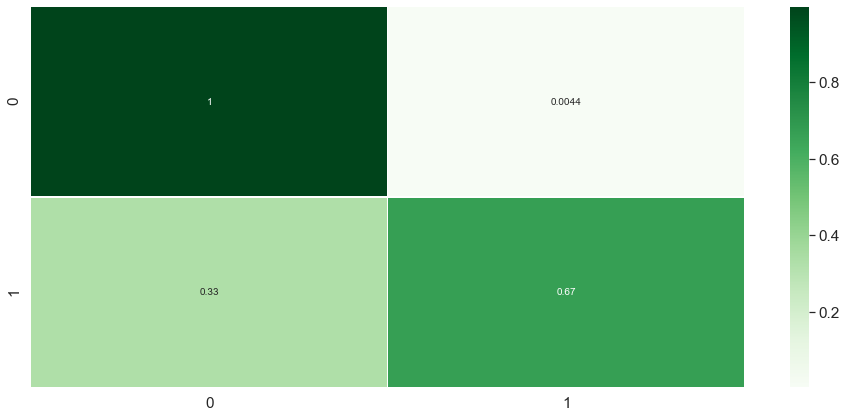

In [321]:
# Get and reshape confusion matrix data
matrix = confusion_matrix(y_test, y_pred_best)
matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]

# Build the plot
plt.figure(figsize=(16,7))
sns.set(font_scale=1.4)
sns.heatmap(matrix, annot=True, annot_kws={'size':10},
            cmap=plt.cm.Greens, linewidths=0.2)

In [82]:
# Top 20 Feature importance
feature_names = [x_train.columns.to_list()]
std = np.std([tree.feature_importances_ for tree in rf_best.estimators_], axis=0)
std = np.array(pd.Series(std).sort_values(ascending=False)[:20])
importances = rf_best.feature_importances_
forest_importances = pd.Series(importances, index=feature_names)
forest_importances = forest_importances.sort_values(ascending =False)[:20]
fig, ax = plt.subplots(figsize=(15, 10))
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

NameError: name 'rf_best' is not defined

### Cost Sensitive Model

In [83]:
from costcla.metrics import cost_loss, savings_score
from costcla.models import CostSensitiveRandomForestClassifier

In [84]:
import numpy as np
fn_cost_train= standard_scaler.fit_transform(np.array(y_train_temp['post_d1_revenue']).reshape(-1,1))
fn_cost_test= standard_scaler.fit_transform(np.array(y_test_temp['post_d1_revenue']).reshape(-1,1))

In [85]:
# Tuning Flase Positive Cost and sample weight
cost_mat_train = np.zeros((len(y_train),4))
for fp_cost in np.linspace(0.1,1,10,endpoint=False):
    for positive_w in [25., 30., 35., 40.]:
        class_weight=[1. if i==0.0 else positive_w for i in y_train ]
        '''Cost matrix of the classification problem Where the columns represents the costs of: 
            false positives, false negatives, true positives and true negatives, for each example.'''
        cost_mat_train[:,0]=fp_cost
        cost_mat_train[:,1]=fn_cost_train.reshape(len(fn_cost_train),)

        cost_mat_test = np.zeros((len(y_test),4))
        cost_mat_test[:,0]=fp_cost
        cost_mat_test[:,1]=fn_cost_test.reshape(len(fn_cost_test),)

        g = CostSensitiveRandomForestClassifier()
        g.fit(np.array(x_train), np.array(y_train), cost_mat_train, sample_weight=class_weight)
        y_pred_rf_cslr=g.predict(np.array(x_test))

        tn, fp, fn, tp = confusion_matrix(y_test, y_pred_rf_cslr).ravel()

        print('cost sensitive: random forest')
        print(f'false positive cost: {fp_cost}')
        print(f'positive weight: {positive_w}')
        print('balanced accuracy is %',1./2*(1.*tp/(tp+fn)+1.*tn/(tn+fp)))

cost sensitive: random forest
false positive cost: 0.1
positive weight: 25.0
balanced accuracy is % 0.8083505584105017
cost sensitive: random forest
false positive cost: 0.1
positive weight: 30.0
balanced accuracy is % 0.827387554696245
cost sensitive: random forest
false positive cost: 0.1
positive weight: 35.0
balanced accuracy is % 0.817052190393813
cost sensitive: random forest
false positive cost: 0.1
positive weight: 40.0
balanced accuracy is % 0.817929874325837
cost sensitive: random forest
false positive cost: 0.19
positive weight: 25.0
balanced accuracy is % 0.7364566373257352
cost sensitive: random forest
false positive cost: 0.19
positive weight: 30.0
balanced accuracy is % 0.7905676007428513
cost sensitive: random forest
false positive cost: 0.19
positive weight: 35.0
balanced accuracy is % 0.7532019563447645
cost sensitive: random forest
false positive cost: 0.19
positive weight: 40.0
balanced accuracy is % 0.7914392426478071
cost sensitive: random forest
false positive co

# Model Summary

### After some trials and tunings, 3 models have 80%+ balanced accuracy
- Manual Tuning Balanced Sample Random Forest (86.1%)
- Weighted Random Forest after Hyperparameter Tuning (83.2%)
- Cost Sensitive Random Forest with some Parameter Tuning (83.9%)

In [86]:
# Model 1: Manual Tuning Balanced Subsample Random Forest
rf_w = RandomForestClassifier(max_depth=13, n_estimators=35, class_weight='balanced_subsample', random_state=0)
rf_w.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced_subsample',
            criterion='gini', max_depth=13, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=35, n_jobs=None, oob_score=False, random_state=0,
            verbose=0, warm_start=False)

In [327]:
# Model 2: Hyper Tuning Weighted Random Forest
rf_best = RandomForestClassifier(**rf_random.best_params_)
rf_best.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='gini', max_depth=None, max_features='sqrt',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=5, min_weight_fraction_leaf=0.0,
            n_estimators=90, n_jobs=None, oob_score=False,
            random_state=None, verbose=0, warm_start=False)

In [87]:
# Model 3: Cost Sensitive Random Forest
class_weight=[1. if i==0.0 else 40 for i in y_train ]
cost_mat_train[:,0]=0.1
cost_mat_train[:,1]=fn_cost_train.reshape(len(fn_cost_train),)

cost_mat_test = np.zeros((len(y_test),4))
cost_mat_test[:,0]=0.1
cost_mat_test[:,1]=fn_cost_test.reshape(len(fn_cost_test),)

rf_cs = CostSensitiveRandomForestClassifier()
rf_cs.fit(np.array(x_train), np.array(y_train), cost_mat_train, sample_weight=class_weight)

CostSensitiveRandomForestClassifier(combination='majority_voting',
                  max_features=1.0, n_estimators=10, n_jobs=1,
                  pruned=False, verbose=False)

### Model Performance Using Test.csv

In [88]:
# Define feature process function
def feature_process(df):
    df['won_rate']=df['matches_won']/df['matches_played']
    df['fix_error_rate']=(df['errors']-df['unfixed_errors'])/df['matches_played']
    df['unfixed_error_rate']=df['unfixed_errors']/df['matches_played']
    df['month']=pd.DatetimeIndex(df['install_date']).month.astype('object')
    X=df[col_x]
    y_temp=df[['response', 'post_d1_revenue']]
    X['country']=X.apply(lambda row: label_country(row), axis=1)
    obj_X = X.select_dtypes(include=['object']).copy()
    obj_X=pd.get_dummies(obj_X, drop_first=True)
    num_X = X.select_dtypes(include=['int64', 'float64']).copy()
    standard_scaler=preprocessing.StandardScaler()
    X_scaled = standard_scaler.fit_transform(num_X)
    X_scaled_df=pd.DataFrame(X_scaled)
    X_scaled_df=X_scaled_df.rename(columns={0:'matches_played', 1:'won_rate', 2:'fix_error_rate', 3:'unfixed_error_rate', 4:'coins_spent', 5:'wild_powerup_used', 6:'undo_powerup_used', 7:'extra_cards_powerup_used', 8:'pre_d1_revenue'})
    X_scaled_df=X_scaled_df.reset_index()
    X_df=obj_X.join(X_scaled_df, how='outer')
    X_df=X_df.drop('index', axis=1)
    return X_df, y_temp

In [89]:
df_valid=pd.read_csv('uken_test_data.csv')
X_valid, y_valid=feature_process(df_valid)

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.

C:\Users\xue.ju\AppData\Local\Continuum\anaconda\lib\site-packages\sklearn\base.py:464: DataConversionWarning:

Data with input dtype int64, float64 were all converted to float64 by StandardScaler.



In [90]:
y_valid=y_valid['response']

In [91]:
# Define model evaluation function
def model_eval(predict, test):
    tn, fp, fn, tp = confusion_matrix(test, predict).ravel()
    print('confusion matrix')
    print(np.array([[tp,fp],[fn,tn]]))
    print('sensitivity is %',1.*tp/(tp+fn))
    print('specificity is %',1.*tn/(tn+fp))
    print('accuracy is %',1.*(tp+tn)/(tp+tn+fp+fn))
    print('balanced accuracy is %',1./2*(1.*tp/(tp+fn)+1.*tn/(tn+fp)))

In [92]:
# Model 1:
rf_w_predict=rf_w.predict(X_valid)
model_eval(rf_w_predict, y_valid)

confusion matrix
[[  447    87]
 [  274 21131]]
sensitivity is % 0.6199722607489597
specificity is % 0.9958997077952682
accuracy is % 0.9835452846529013
balanced accuracy is % 0.8079359842721139


In [334]:
# Model 2:
rf_best_predict=rf_best.predict(X_valid)
model_eval(rf_best_predict, y_valid)

confusion matrix
[[  391    41]
 [  330 21177]]
sensitivity is % 0.5423023578363384
specificity is % 0.9980676783862759
accuracy is % 0.9830894753635079
balanced accuracy is % 0.7701850181113071


In [93]:
# Model 3:
rf_cs_predict=rf_cs.predict(np.array(X_valid))
model_eval(rf_cs_predict, y_valid)

confusion matrix
[[  415   108]
 [  306 21110]]
sensitivity is % 0.5755894590846047
specificity is % 0.9949099820906777
accuracy is % 0.9811294954191166
balanced accuracy is % 0.7852497205876412


# Possible Improvement
- Better strategy to remove more outliers
- Better way to deal with the matches variables rather than use rate
- Use all countries rather than just top 15
- Check if there is any trend of each match time sequentially

In [94]:
X_new=X_valid[['matches_played', 'won_rate', 'fix_error_rate', 'unfixed_error_rate', 'coins_spent', 'wild_powerup_used', 'undo_powerup_used', 'extra_cards_powerup_used', 'pre_d1_revenue']]

In [96]:
X_rescale=pd.DataFrame(X_new)
# Create the new data frame by transforming data using PCA
pca=PCA(n_components=3)
components=pca.fit_transform(X_rescale)
componentsDf=pd.DataFrame(data=components, columns=['component'+str(i) for i in range(1,4)])

In [97]:
# Have a look of PCA variables
componentsDf.head()

,component1,component2,component3
0,0.132158,-1.397825,-0.424138
1,2.137257,-1.222108,-0.638302
2,-1.708477,0.719454,-0.070167
3,2.740422,-1.773448,-0.958041
4,2.903633,-0.665729,-1.003246


In [98]:
print(pca.explained_variance_ratio_)

[0.45928391 0.16902979 0.1078183 ]


In [100]:
y_valid.head()

0    0
1    0
2    0
3    0
4    0
Name: response, dtype: int64

In [101]:
fig=px.scatter_3d(x=componentsDf['component1'], y=componentsDf['component2'], z=componentsDf['component3'], color=y_valid)
fig.show()